In [1]:
import numpy as np
import os
import librosa
from IPython.display import Audio
import medleydb as mdb

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

In [23]:
data_dir = ("/scratch/rmb456/multif0_ismir2017/" +
    "training_data_with_blur/multif0_complete")

trackid = "MatthewEntwistle_TheFlaxenField"
mtrack = mdb.MultiTrack(trackid)
data = np.load(
    os.path.join(data_dir, "{}_multif0_complete.npz".format(trackid)),
    mmap_mode='r'
)
audio_path = os.path.join(data_dir, "{}_multif0_MIX.wav".format(trackid))

In [4]:
audio_path

'/scratch/rmb456/multif0_ismir2017/training_data_with_blur/multif0_complete/Grants_PunchDrunk_multif0_MIX.wav'

In [24]:
# y, fs = librosa.load(mtrack.mix_path)
y, fs = librosa.load(audio_path)

In [25]:
Audio(y, rate=fs)

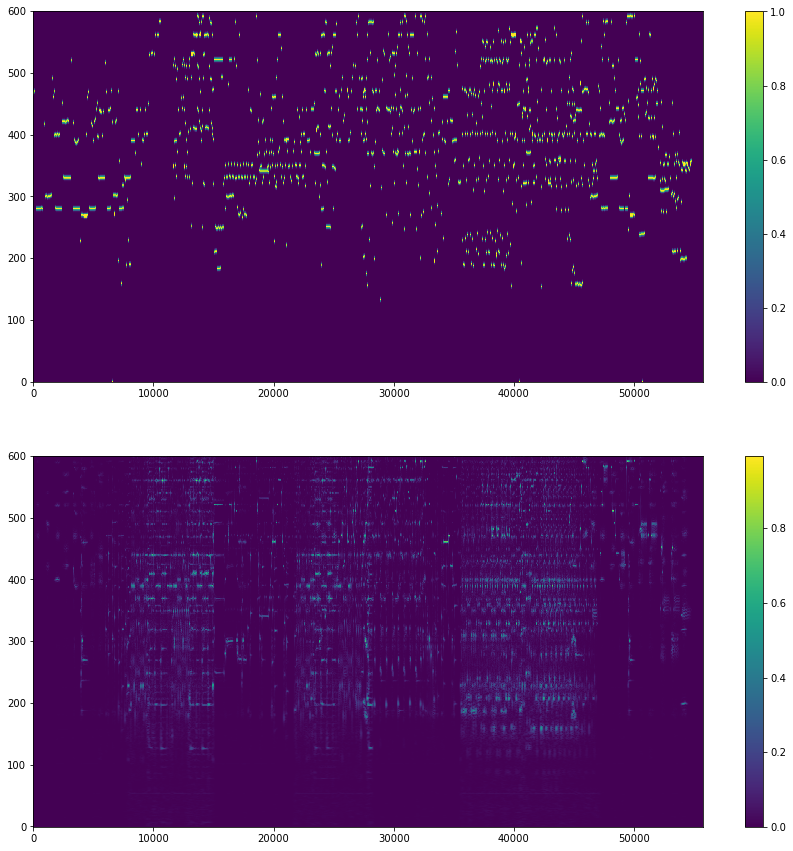

In [26]:
plt.figure(figsize=(15, 15))
plt.subplot(2, 1, 1)
plt.imshow(data['data_out'], origin='lower', interpolation=None)
plt.axis('auto')
plt.colorbar()
plt.subplot(2, 1, 2)
plt.imshow(data['data_in'][1], origin='lower', interpolation='none')
plt.axis('auto')
plt.colorbar()
# plt.savefig("input_output_pair.pdf", ext='pdf')

In [72]:
import medleydb as mdb
import compute_training_data as C
import librosa

In [53]:
mtrack = mdb.MultiTrack("MusicDelta_SwingJazz")

In [55]:
piano_stem = mtrack.stems[3]

In [98]:
annot_data = piano_stem.pitch_annotation
mtrack_duration = mtrack.duration
mtrack_duration

89.51292517006803

In [84]:
annot = np.array(annot_data).T
times = annot[0]
freqs = annot[1]

n_time_frames = int(np.ceil(mtrack_duration * float(44100)))
time_grid = librosa.core.frames_to_time(
    range(n_time_frames), sr=44100, hop_length=1
)
time_bins = C.grid_to_bins(time_grid, 0.0, time_grid[-1])

annot_time_idx = np.digitize(times, time_bins) - 1
annot_time_idx = annot_time_idx[annot_time_idx < len(time_grid)]

freq_complete = np.zeros(time_grid.shape)
freq_complete[annot_time_idx] = freqs

annot_activation = np.array(freq_complete > 0, dtype=float)


(4, 6)

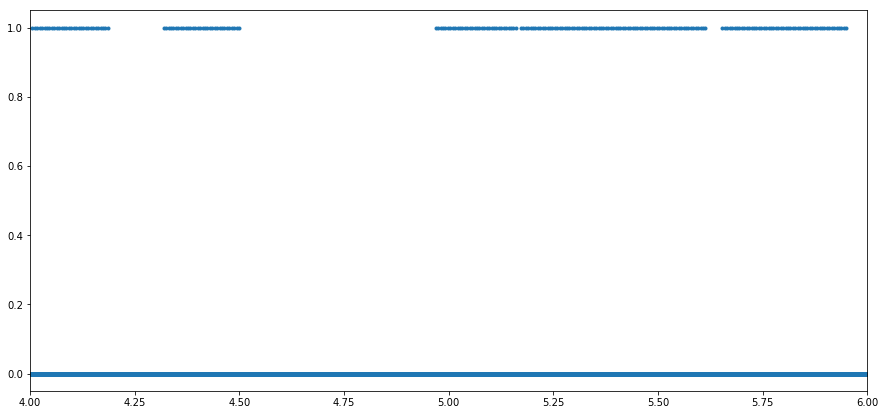

In [95]:
plt.figure(figsize=(15, 7))
plt.plot(time_grid, annot_activation, '.')
plt.xlim(4, 6)

In [96]:
import scipy.signal

In [97]:
annot_activation

array([ 0.,  0.,  0., ...,  0.,  0.,  0.])

In [118]:
x = 5